# Battle of the Neighborhoods- Week 2

## Part 1: Download and explore the New York City geographical coordinates dataset

NYC has a total of 5 boroughs and 306 neighborhoods. In order to segement the neighborhoods and explore them, we will essentially need a dataset that contains the 5 boroughs and the neighborhoods that exist in each borough as well as the the latitude and logitude coordinates of each neighborhood.

Link to the dataset: https://geo.nyu.edu/catalog/nyu_2451_34572


First, we shall download all the packages needed.

In [1]:
!pip install geopy
!pip install folium
import folium
import numpy as np
import pandas as pd
import requests
import json
import matplotlib.cm as cm
import matplotlib.colors as colors

from pandas.io.json import json_normalize
from geopy.geocoders import Nominatim

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

print('Libraries imported')

     |████████████████████████████████| 93 kB 2.9 MB/s  eta 0:00:01
Libraries imported


In [2]:
!wget -q -O 'newyork_data.json' https://ibm.box.com/shared/static/fbpwbovar7lf8p5sgddm06cgipa2rxpe.json
print('Data downloaded!')

Data downloaded!


Load and explore the data

In [3]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

All the relevant data is in the features key, which is basically a list of the neighborhoods. So, define a new variable that includes this data.

In [4]:
neighborhoods_data = newyork_data['features']

Taking a look at the first item on the list

In [5]:
neighborhoods_data[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

Transforming the data to a Pandas dataframe

In [6]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

In [7]:
neighborhoods

,Borough,Neighborhood,Latitude,Longitude


Looping and filling the data frame one row at a time

In [8]:
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [9]:
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


Let's make sure that the dataset has all 5 boroughs and 306 neighborhoods.

In [10]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


In [11]:
neighborhoods.to_csv('BON1_NYC_GEO.csv',index=False)

Getting the coordinates of New York City

In [12]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="Jupyter")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


Creating a map with the boroughs of New York City superimposed on top

In [13]:
# create map of New York using latitude and longitude values
map_NewYork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_NewYork)  
    
map_NewYork

## Part 2: Web scraping data of population and demographic data for NYC from Wikipedia

#### POPULATION DATA
Web scrapping of Population data from wikipedia page - https://en.wikipedia.org/wiki/New_York_City

In [15]:
import matplotlib.pyplot as plt

from bs4 import BeautifulSoup

import csv
print('Libraries imported')

Libraries imported


Web scraping the data from Wikipedia using Beautiful Soup

In [16]:
website_url = requests.get('https://en.wikipedia.org/wiki/Demographics_of_New_York_City').text
soup = BeautifulSoup(website_url,'lxml')
table = soup.find('table',{'class':'wikitable sortable'})
#print(soup.prettify())

headers = [header.text for header in table.find_all('th')]

table_rows = table.find_all('tr')        
rows = []
for row in table_rows:
   td = row.find_all('td')
   row = [row.text for row in td]
   rows.append(row)

with open('BON2_POPULATION1.csv', 'w') as f:
   writer = csv.writer(f)
   writer.writerow(headers)
   writer.writerows(row for row in rows if row)

In [17]:
#load data from csv
Pop_data=pd.read_csv('BON2_POPULATION1.csv')
Pop_data.drop(Pop_data.columns[[7,8,9,10,11]], axis=1,inplace=True)
print('Data downloaded!')

Data downloaded!


In [18]:
#removing white spaces
Pop_data.columns = Pop_data.columns.str.replace(' ', '')
Pop_data.columns = Pop_data.columns.str.replace('\'','')
Pop_data.rename(columns={'Borough':'persons_sq_mi','County':'persons_sq_km'}, inplace=True)
Pop_data

,NewYorkCitysfiveboroughsvte\n,Jurisdiction\n,Population\n,GrossDomesticProduct\n,Landarea\n,Density\n,persons_sq_mi,squarekm,persons/mi2,persons/km2\n
0,The Bronx\n,\n Bronx\n,"1,418,207\n",42.695\n,"30,100\n",42.10\n,109.04\n,NaN,NaN,NaN
1,Brooklyn\n,\n Kings\n,"2,559,903\n",91.559\n,"35,800\n",70.82\n,183.42\n,NaN,NaN,NaN
2,Manhattan\n,\n New York\n,"1,628,706\n",600.244\n,"368,500\n",22.83\n,59.13\n,NaN,NaN,NaN
3,Queens\n,\n Queens\n,"2,253,858\n",93.310\n,"41,400\n",108.53\n,281.09\n,NaN,NaN,NaN
4,Staten Island\n,\n Richmond\n,"476,143\n",14.514\n,"30,500\n",58.37\n,151.18\n,NaN,NaN,NaN
5,City of New York,"8,336,817",842.343,"101,000",302.64,783.83,"27,547",NaN,NaN,NaN
6,State of New York,"19,453,561","1,731.910","89,000","47,126.40","122,056.82",412,NaN,NaN,NaN
7,Sources:[12][13][14] and see individual boroug...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
Pop_data.drop(columns= {'GrossDomesticProduct\n', 'squarekm', 'persons/mi2', 'persons/km2\n'}, inplace= True)
Pop_data

,NewYorkCitysfiveboroughsvte\n,Jurisdiction\n,Population\n,Landarea\n,Density\n,persons_sq_mi
0,The Bronx\n,\n Bronx\n,"1,418,207\n","30,100\n",42.10\n,109.04\n
1,Brooklyn\n,\n Kings\n,"2,559,903\n","35,800\n",70.82\n,183.42\n
2,Manhattan\n,\n New York\n,"1,628,706\n","368,500\n",22.83\n,59.13\n
3,Queens\n,\n Queens\n,"2,253,858\n","41,400\n",108.53\n,281.09\n
4,Staten Island\n,\n Richmond\n,"476,143\n","30,500\n",58.37\n,151.18\n
5,City of New York,"8,336,817",842.343,302.64,783.83,"27,547"
6,State of New York,"19,453,561","1,731.910","47,126.40","122,056.82",412
7,Sources:[12][13][14] and see individual boroug...,NaN,NaN,NaN,NaN,NaN


In [20]:
Pop_data.rename(columns = {'NewYorkCitysfiveboroughsvte\n' : 'Borough',
                   'Jurisdiction\n':'County',
                   'Population\n':'Estimate_2017', 
                   'Landarea\n':'square_miles',
                    'Density\n':'square_km'}, inplace=True)
Pop_data

,Borough,County,Estimate_2017,square_miles,square_km,persons_sq_mi
0,The Bronx\n,\n Bronx\n,"1,418,207\n","30,100\n",42.10\n,109.04\n
1,Brooklyn\n,\n Kings\n,"2,559,903\n","35,800\n",70.82\n,183.42\n
2,Manhattan\n,\n New York\n,"1,628,706\n","368,500\n",22.83\n,59.13\n
3,Queens\n,\n Queens\n,"2,253,858\n","41,400\n",108.53\n,281.09\n
4,Staten Island\n,\n Richmond\n,"476,143\n","30,500\n",58.37\n,151.18\n
5,City of New York,"8,336,817",842.343,302.64,783.83,"27,547"
6,State of New York,"19,453,561","1,731.910","47,126.40","122,056.82",412
7,Sources:[12][13][14] and see individual boroug...,NaN,NaN,NaN,NaN,NaN


In [21]:
# shifting data in the last two rows
Pop_data.loc[5:,['square_km','persons_sq_mi']] = Pop_data.loc[2:,['square_km','persons_sq_mi']].shift(1,axis=1)
Pop_data.loc[5:,['square_miles','square_km']] = Pop_data.loc[2:,['square_miles','square_km']].shift(1,axis=1)
Pop_data.loc[5:,['Estimate_2017','square_miles']] = Pop_data.loc[2:,['Estimate_2017','square_miles']].shift(1,axis=1)
Pop_data.loc[5:,['County','Estimate_2017']] = Pop_data.loc[2:,['County','Estimate_2017']].shift(1,axis=1)
Pop_data.loc[5:,['Borough','County']] = Pop_data.loc[2:,['Borough','County']].shift(1,axis=1)
Pop_data

,Borough,County,Estimate_2017,square_miles,square_km,persons_sq_mi
0,The Bronx\n,\n Bronx\n,"1,418,207\n","30,100\n",42.10\n,109.04\n
1,Brooklyn\n,\n Kings\n,"2,559,903\n","35,800\n",70.82\n,183.42\n
2,Manhattan\n,\n New York\n,"1,628,706\n","368,500\n",22.83\n,59.13\n
3,Queens\n,\n Queens\n,"2,253,858\n","41,400\n",108.53\n,281.09\n
4,Staten Island\n,\n Richmond\n,"476,143\n","30,500\n",58.37\n,151.18\n
5,NaN,City of New York,"8,336,817",842.343,302.64,783.83
6,NaN,State of New York,"19,453,561","1,731.910","47,126.40","122,056.82"
7,NaN,Sources:[12][13][14] and see individual boroug...,NaN,NaN,NaN,NaN


In [22]:
Pop_data['Borough']=Pop_data['Borough'].replace(to_replace='\n', value='', regex=True)
Pop_data['County']=Pop_data['County'].replace(to_replace='\n', value='', regex=True)
Pop_data['Estimate_2017']=Pop_data['Estimate_2017'].replace(to_replace='\n', value='', regex=True)
Pop_data['square_miles']=Pop_data['square_miles'].replace(to_replace='\n', value='', regex=True)
Pop_data['square_km']=Pop_data['square_km'].replace(to_replace='\n', value='', regex=True)
Pop_data['persons_sq_mi']=Pop_data['persons_sq_mi'].replace(to_replace='\n', value='', regex=True)
Pop_data

,Borough,County,Estimate_2017,square_miles,square_km,persons_sq_mi
0,The Bronx,Bronx,"1,418,207","30,100",42.10,109.04
1,Brooklyn,Kings,"2,559,903","35,800",70.82,183.42
2,Manhattan,New York,"1,628,706","368,500",22.83,59.13
3,Queens,Queens,"2,253,858","41,400",108.53,281.09
4,Staten Island,Richmond,"476,143","30,500",58.37,151.18
5,NaN,City of New York,"8,336,817",842.343,302.64,783.83
6,NaN,State of New York,"19,453,561","1,731.910","47,126.40","122,056.82"
7,NaN,Sources:[12][13][14] and see individual boroug...,NaN,NaN,NaN,NaN


In [23]:
#removing NaN
Pop_data = Pop_data.fillna('')
Pop_data

,Borough,County,Estimate_2017,square_miles,square_km,persons_sq_mi
0,The Bronx,Bronx,"1,418,207","30,100",42.10,109.04
1,Brooklyn,Kings,"2,559,903","35,800",70.82,183.42
2,Manhattan,New York,"1,628,706","368,500",22.83,59.13
3,Queens,Queens,"2,253,858","41,400",108.53,281.09
4,Staten Island,Richmond,"476,143","30,500",58.37,151.18
5,,City of New York,"8,336,817",842.343,302.64,783.83
6,,State of New York,"19,453,561","1,731.910","47,126.40","122,056.82"
7,,Sources:[12][13][14] and see individual boroug...,,,,


In [24]:
# dropping the last row as it is not needed
Pop_data.drop(7)

,Borough,County,Estimate_2017,square_miles,square_km,persons_sq_mi
0,The Bronx,Bronx,"1,418,207","30,100",42.10,109.04
1,Brooklyn,Kings,"2,559,903","35,800",70.82,183.42
2,Manhattan,New York,"1,628,706","368,500",22.83,59.13
3,Queens,Queens,"2,253,858","41,400",108.53,281.09
4,Staten Island,Richmond,"476,143","30,500",58.37,151.18
5,,City of New York,"8,336,817",842.343,302.64,783.83
6,,State of New York,"19,453,561","1,731.910","47,126.40","122,056.82"


In [25]:
Pop_data.to_csv('BON2_POPULATION.csv',index=False)

#### DEMOGRAPHICS DATA

We will web scrap Demographics data from wikipedia page - https://en.wikipedia.org/wiki/New_York_City using Beautiful soup

In [27]:
# The code was removed by Watson Studio for sharing.

,Racial Composition,2010,1990,1970,1940
0,White,44.00%,52.30%,76.60%,93.60%
1,Non-Hispanic,33.30%,43.20%,62.90%,92%
2,Black or African American,25.50%,28.70%,21.10%,6.10%
3,Hispanic or Latino,28.60%,24.40%,16.20%,1.60%
4,Asian,12.70%,7.00%,1.20%,--


In [28]:
demo_data.to_csv('BON2_DEMOGRAPHICS.csv',index=False)

## Part 3: Download and explore NYC Cuisines dataset

In [29]:
# Installing the required libraries

!pip install wordcloud
from PIL import Image 

%matplotlib inline

import matplotlib as mpl

mpl.style.use('ggplot')

# check for latest version of Matplotlib
print ('Matplotlib version: ', mpl.__version__) # >= 2.0.0

# import package and its set of stopwords
from wordcloud import WordCloud, STOPWORDS

print ('Wordcloud is installed and imported!')

     |████████████████████████████████| 366 kB 11.8 MB/s eta 0:00:01
Matplotlib version:  3.2.2
Wordcloud is installed and imported!


In [30]:
# The code was removed by Watson Studio for sharing.

,Borough,Neighborhood,Cuisine
0,The Bronx,Bedford Park,"Mexican, Puerto Rican, Dominican, Korean"
1,The Bronx,Belmont,"Italian, Albanian"
2,The Bronx,City Island,"Italian, Seafood"
3,The Bronx,Morris Park,"Italian, Albanian"
4,The Bronx,Norwood,Filipino


In [31]:
cuisine.shape

(57, 3)

In [32]:
print(cuisine.Borough.unique())

['The Bronx' 'Queens' 'Brooklyn' 'Manhattan' 'Staten Island']


In [33]:
cuisine['Borough'].value_counts().to_frame()

,Borough
Brooklyn,19
Manhattan,13
Queens,13
The Bronx,9
Staten Island,3


### Word cloud of all the cusinies

In [34]:
cuisine_wc = cuisine[['Cuisine']]
cuisine_wc

,Cuisine
0,"Mexican, Puerto Rican, Dominican, Korean"
1,"Italian, Albanian"
2,"Italian, Seafood"
3,"Italian, Albanian"
4,Filipino
5,Jewish
6,"Puerto Rican, Dominican"
7,"Jamaican, West Indian"
8,Irish
9,"Greek, Italian, Eastern European, Brazilian, E..."


In [35]:
cuisine_wc.to_csv('CUISINE_WC.txt', sep=',', index=False)

In [36]:
cuisine_wc1= open('CUISINE_WC.txt', 'r').read()

In [37]:
stopwords= set(STOPWORDS)

In [38]:
# instantiate a word cloud object
nyc_cuisine_wc = WordCloud(
    background_color='white',
    max_words=2000,
    stopwords=stopwords
)

# generate the word cloud
nyc_cuisine_wc.generate(cuisine_wc1)

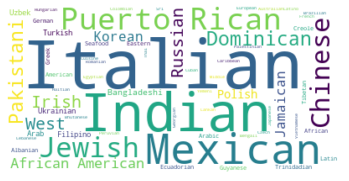

<Figure size 2160x3240 with 0 Axes>

In [39]:
# display the word cloud
plt.imshow(nyc_cuisine_wc, interpolation='bilinear')
plt.axis('off')

fig = plt.figure()
fig.set_figwidth(30)
fig.set_figheight(45)

plt.show()

Most Preferred Food in New York City -

1. Italian
2. Puerto Rican
3. Mexican
4. Jewish
5. Indian
6. Pakistani
7. Dominican

## Brooklyn Cuisine- Word Cloud

In [40]:
Brooklyn = cuisine[cuisine['Borough'] == 'Brooklyn'].reset_index(drop=True)
Brooklyn.head()

,Borough,Neighborhood,Cuisine
0,Brooklyn,Bay Ridge,"Irish, Italian, Greek, Turkish, Lebanese, Pale..."
1,Brooklyn,Bedford-Stuyvesant,"African- American, Jamaican, Trinidadian, Puer..."
2,Brooklyn,Bensonhurst,"Italian, Mexican, Chinese, Turkish, Russian, U..."
3,Brooklyn,Borough Park,"Jewish, Italian, Mexican, Chinese"
4,Brooklyn,Brighton Beach,"Russian, Georgian, Turkish, Pakistani, Ukrainian"


In [41]:
br_wc = Brooklyn[['Cuisine']]
br_wc

,Cuisine
0,"Irish, Italian, Greek, Turkish, Lebanese, Pale..."
1,"African- American, Jamaican, Trinidadian, Puer..."
2,"Italian, Mexican, Chinese, Turkish, Russian, U..."
3,"Jewish, Italian, Mexican, Chinese"
4,"Russian, Georgian, Turkish, Pakistani, Ukrainian"
5,"Puerto Rican, Dominican, Mexican, Ecuadorian"
6,"Jamaican, West Indian, African-American"
7,Italian
8,"Jamaican, West Indian, Jewish"
9,"African- American, Dominican, Puerto Rican"


In [42]:
br_wc.to_csv('BR_CUISINE.txt', sep=',', index=False)

In [43]:
br_wc1 = open('BR_CUISINE.txt', 'r').read()

In [44]:
stopwords = set(STOPWORDS)

In [45]:
# instantiate a word cloud object
br_cuisine = WordCloud(
    background_color='white',
    max_words=2000,
    stopwords=stopwords
)

# generate the word cloud
br_cuisine.generate(br_wc1)

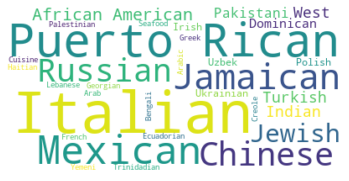

<Figure size 2160x3240 with 0 Axes>

In [46]:
# display the word cloud
plt.imshow(br_cuisine, interpolation='bilinear')
plt.axis('off')

fig = plt.figure()
fig.set_figwidth(30)
fig.set_figheight(45)

plt.show()

Most preferred food in Brooklyn:
1. Italian
2. Puerto Rican
3. Mexican

## Queens Cuisine- Word cloud

In [47]:
queens= cuisine[cuisine['Borough']== 'Queens'].reset_index(drop= True)
queens.head()

,Borough,Neighborhood,Cuisine
0,Queens,Astoria,"Greek, Italian, Eastern European, Brazilian, E..."
1,Queens,Bellerose,"Indian, Pakistani"
2,Queens,Flushing,"Chinese, Korean"
3,Queens,Forest Hills; Kew Gardens Hills; Rego Park,"Jewish, Russian, Uzbek"
4,Queens,Howard Beach; Ozone Park,Italian


In [48]:
queens_wc= queens[['Cuisine']]
queens_wc

,Cuisine
0,"Greek, Italian, Eastern European, Brazilian, E..."
1,"Indian, Pakistani"
2,"Chinese, Korean"
3,"Jewish, Russian, Uzbek"
4,Italian
5,"German, Polish"
6,"Indian, Pakistani, Bangladeshi, Colombian, Ecu..."
7,"Bangladeshi, Caribbean; African-American; Afri..."
8,"Arab, Chinese, Indian"
9,"Indian, Guyanese, Trinidadian, Pakistani, Bang..."


In [49]:
queens_wc.to_csv('Queens.txt', sep= ',', index= False)

In [50]:
queens_wc1= open('Queens.txt', 'r').read()

In [51]:
stopwords= set(STOPWORDS)

In [52]:
# instantiate a word cloud object
queens_cuisine = WordCloud(
    background_color='white',
    max_words=2000,
    stopwords=stopwords
)

# generate the word cloud
queens_cuisine.generate(queens_wc1)

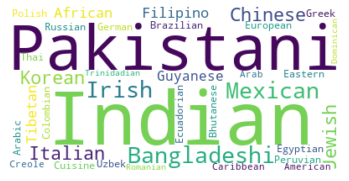

<Figure size 2160x3240 with 0 Axes>

In [53]:
# display the word cloud
plt.imshow(queens_cuisine, interpolation='bilinear')
plt.axis('off')

fig = plt.figure()
fig.set_figwidth(30)
fig.set_figheight(45)

plt.show()

Top cuisines in Queens are
1. Indian
2. Pakistani
3. Bangladeshi
4. Mexican
5. Irish

## Manhattan Cuisine- Word Cloud

In [54]:
Manhattan= cuisine[cuisine['Borough'] == 'Manhattan'].reset_index(drop=True)
Manhattan.head()

,Borough,Neighborhood,Cuisine
0,Manhattan,Chinatown,"Chinese, Vietnamese"
1,Manhattan,East Harlem,"Puerto Rican, Mexican, Dominican, Chinese-Cuba..."
2,Manhattan,East Village,"Japanese, Korean, Indian, Ukrainian"
3,Manhattan,Greenwich Village,"Italian, Middle Eastern"
4,Manhattan,Harlem,"Italian, African-American, Latin American, Wes..."


In [55]:
mn_wc = Manhattan[['Cuisine']]
mn_wc

,Cuisine
0,"Chinese, Vietnamese"
1,"Puerto Rican, Mexican, Dominican, Chinese-Cuba..."
2,"Japanese, Korean, Indian, Ukrainian"
3,"Italian, Middle Eastern"
4,"Italian, African-American, Latin American, Wes..."
5,Korean
6,Australian
7,Italian
8,"Puerto Rican, Jewish, Italian, Latin American"
9,"Indian, Pakistani, Bangladeshi"


In [56]:
mn_wc.to_csv('MN_CUISINE.txt', sep=',', index=False)

In [57]:
mn_wc1= open('MN_CUISINE.txt', 'r').read()

In [58]:
stopwords= set(STOPWORDS)

In [59]:
# instantiate a word cloud object
mn_cuisine = WordCloud(
    background_color='white',
    max_words=2000,
    stopwords=stopwords
)

# generate the word cloud
mn_cuisine.generate(mn_wc1)

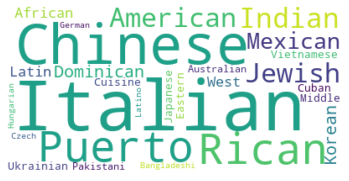

<Figure size 2160x3240 with 0 Axes>

In [60]:
# display the word cloud
plt.imshow(mn_cuisine, interpolation='bilinear')
plt.axis('off')

fig = plt.figure()
fig.set_figwidth(30)
fig.set_figheight(45)

plt.show()

Top cuisines in Manhattan are:
1. Italian
2. Chinese
3. Puerto Rican
4. Indian

## The Bronx Cuisine- Word Cloud

In [61]:
bronx= cuisine[cuisine['Borough']=='The Bronx'].reset_index(drop= True)
bronx

,Borough,Neighborhood,Cuisine
0,The Bronx,Bedford Park,"Mexican, Puerto Rican, Dominican, Korean"
1,The Bronx,Belmont,"Italian, Albanian"
2,The Bronx,City Island,"Italian, Seafood"
3,The Bronx,Morris Park,"Italian, Albanian"
4,The Bronx,Norwood,Filipino
5,The Bronx,Riverdale,Jewish
6,The Bronx,South Bronx,"Puerto Rican, Dominican"
7,The Bronx,Wakefield,"Jamaican, West Indian"
8,The Bronx,Woodlawn,Irish


In [62]:
bx_wc= bronx[['Cuisine']]
bx_wc

,Cuisine
0,"Mexican, Puerto Rican, Dominican, Korean"
1,"Italian, Albanian"
2,"Italian, Seafood"
3,"Italian, Albanian"
4,Filipino
5,Jewish
6,"Puerto Rican, Dominican"
7,"Jamaican, West Indian"
8,Irish


In [63]:
bx_wc.to_csv('BX_CUISINE.txt', sep= ',', index= False)

In [64]:
bx_wc1= open('BX_CUISINE.txt', 'r').read()

In [65]:
stopwords= set(STOPWORDS)

In [66]:
# instantiate a word cloud object
bx_cuisine = WordCloud(
    background_color='white',
    max_words=2000,
    stopwords=stopwords
)

# generate the word cloud
bx_cuisine.generate(bx_wc1)

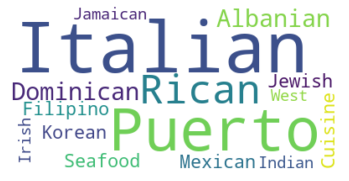

<Figure size 2160x3240 with 0 Axes>

In [67]:
# display the word cloud
plt.imshow(bx_cuisine, interpolation='bilinear')
plt.axis('off')

fig = plt.figure()
fig.set_figwidth(30)
fig.set_figheight(45)

plt.show()

Top cuisines in The Bronx:
1. Italian
2. Puerto Rican
3. Dominican
4. Albanian

## Part 4: Downloading and exploring Farmers Market dataset

In [68]:
!pip install seaborn
import json
from matplotlib.ticker import NullFormatter
import matplotlib.ticker as ticker

import seaborn as sns 

print('Libraries imported.')


Libraries imported.


The dataset is downloaded from the website. The link is as given below :

https://data.cityofnewyork.us/dataset/DOHMH-Farmers-Markets-and-Food-Boxes/8vwk-6iz2

In [69]:
# The code was removed by Watson Studio for sharing.

,Borough,Market Name,Street Address,Latitude,Longitude,Days of Operation,Hours of Operations,Season Dates,Accepts EBT,Open Year-Round,Stellar Cooking Demonstrations,Food Activities for Kids,Location Point
0,Brooklyn,Urban Oasis Farmers' Market,681 Clarkson Ave.,40.656255,-73.936608,Wednesday,2pm-5:30pm,06/24/20-11/04/20,No,No,NaN,NaN,"(40.656255, -73.936608)"
1,Staten Island,Goodhue Center Go!Healthy Farm Stand,301 Prospect Ave,40.638983,-74.097422,Tuesday,11am-2pm,07/06/20-11/20/20,Yes,No,NaN,NaN,"(40.638983, -74.097422)"
2,Manhattan,Morningside Park's Down to Earth Farmers' Market,W 110th St & Manhattan Ave,40.801155,-73.959647,Saturday,9am-4pm (winter closes at 3pm),Year-Round,Yes,Yes,NaN,NaN,"(40.801155, -73.959647)"
3,Bronx,170 Farm Stand,E 170th St & Townsend Ave,40.839882,-73.916783,Wednesday,2:30pm-6:30pm,7/15/20-11/25/20,Yes,No,NaN,NaN,"(40.839882, -73.916783)"
4,Manhattan,Go!Healthy Farm Stand at Mirabal Sisters Campus,21 Jumel Pl.,40.839305,-73.936159,Friday,11am-2pm,07/07/2020-11/20/20,Yes,No,NaN,NaN,"(40.839305, -73.936159)"


In [70]:
fm_data.shape

(141, 13)

In [71]:
fm_data['Borough']= fm_data['Borough'].replace(to_replace= 'BRooklyn', value= 'Brooklyn', regex= True)

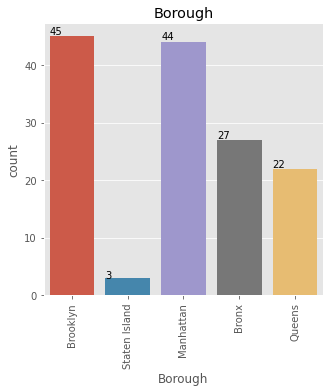

In [73]:
fig,ax = plt.subplots(1, 1, figsize=(5, 5))
sns.countplot(x='Borough',data=fm_data)
ax.set_title("Borough")
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate('', (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01))
        ax.set_xticklabels([t.get_text().split("T")[0] for t in ax.get_xticklabels()])

# This sets the yticks "upright" with 0, as opposed to sideways with 90.
plt.xticks(rotation=90) 
plt.show()

Brooklyn and Manhattan have the highest number of farmers markets

#### Using geopy library to get the coordinates of NYC

In [74]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="Jupyter")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [75]:
# create map of New York City using latitude and longitude values
map_markets = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, MarketName, borough in zip(fm_data['Latitude'], fm_data['Longitude'], fm_data['Market Name'], fm_data['Borough']):
            label = '{}, {}'.format(MarketName, borough)
            label = folium.Popup(label, parse_html=True)
            folium.CircleMarker(
                [lat, lng],
                radius=5,
                popup=label,
                color='green',
                fill=True,
                fill_color='green',
                fill_opacity=0.7,
                parse_html = False).add_to(map_markets)  

map_markets

## Part 5.1: Segmenting and Clustering the boroughs of NYC

In this section of the capstone project, we will use the Foursquare API to explore neighborhoods in Brooklyn and Manhattan. We will use the explore function to get the most common venue categories in each neighborhood, and then use this feature to group the neighborhoods into clusters. We will use the k-means clustering algorithm to complete this task. Finally, we will use the Folium library to visualize the neighborhoods in Brooklyn and Manhattan and their emerging clusters.

In [76]:
# import k-means from clustering stage
from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_score

print('Libraries imported.')

Libraries imported.


### 1. Download and explore the dataset

NYC has a total of 5 boroughs and 306 neighborhoods. In order to segement the neighborhoods and explore them, we will essentially need a dataset that contains the 5 boroughs and the neighborhoods that exist in each borough as well as the latitude and logitude coordinates of each neighborhood.

In [77]:
geo_data=pd.read_csv('BON1_NYC_GEO.csv')
print('Data downloaded!')

Data downloaded!


In [78]:
geo_data.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [79]:
geo_data['Borough'].value_counts().to_frame()

,Borough
Queens,81
Brooklyn,70
Staten Island,63
Bronx,52
Manhattan,40


In [80]:
geo_data.shape

(306, 4)

In [81]:
print(geo_data.Borough.unique())

['Bronx' 'Manhattan' 'Brooklyn' 'Queens' 'Staten Island']


In [82]:
geo_data.isnull().sum()

Borough         0
Neighborhood    0
Latitude        0
Longitude       0
dtype: int64

## Segmenting data in Brooklyn and Manhattan

In [83]:
bm_geo = geo_data.loc[(geo_data['Borough'] == 'Brooklyn')|(geo_data['Borough'] == 'Manhattan')]
bm_geo = bm_geo.reset_index(drop=True)
bm_geo.head()

,Borough,Neighborhood,Latitude,Longitude
0,Manhattan,Marble Hill,40.876551,-73.910660
1,Brooklyn,Bay Ridge,40.625801,-74.030621
2,Brooklyn,Bensonhurst,40.611009,-73.995180
3,Brooklyn,Sunset Park,40.645103,-74.010316
4,Brooklyn,Greenpoint,40.730201,-73.954241


In [84]:
bm_geo.shape

(110, 4)

In [85]:
import time
start_time = time.time()

address = 'New York City, NY'

geolocator = Nominatim(user_agent="Jupyter")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

print("--- %s seconds ---" % round((time.time() - start_time), 2))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.
--- 1.03 seconds ---


### Creating a map of Brooklyn and Manhattan with neighborhoods superimposed on top

In [86]:
map_bm = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(bm_geo['Latitude'], bm_geo['Longitude'], bm_geo['Borough'], bm_geo['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_bm)  
    
map_bm

In [87]:
CLIENT_ID = 'OLN1BAQQBHO234LKFIU1ZNGV4Z3O3P1GS5KIMTNPJHLX1MKL' # your Foursquare ID
CLIENT_SECRET = 'VDM5CGGVSUOGKMY21ETO4J1UAJH5QJEALQCJAIWUF2DJXR2T' # your Foursquare Secret
VERSION = '20181218' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: OLN1BAQQBHO234LKFIU1ZNGV4Z3O3P1GS5KIMTNPJHLX1MKL
CLIENT_SECRET:VDM5CGGVSUOGKMY21ETO4J1UAJH5QJEALQCJAIWUF2DJXR2T


### 2. Exploring neighborhoods in Brooklyn and Manhattan

Extract venue data for each neighborhood in Brooklyn

In [88]:
def getNearbyVenues(names, latitudes, longitudes, LIMIT=200, radius=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Running the above function on each neighborhood and creating a new dataframe called bm_venues

In [89]:
bm_venues = getNearbyVenues(names=bm_geo['Neighborhood'],
                                  latitudes=bm_geo['Latitude'],
                                  longitudes=bm_geo['Longitude'],
                                  LIMIT=200)

print('The "BM_venues" dataframe has {} venues and {} unique venue types.'.format(
      len(bm_venues['Venue Category']),
      len(bm_venues['Venue Category'].unique())))

bm_venues.to_csv('BM_venues.csv', sep=',', encoding='UTF8')
bm_venues.head()

Marble Hill
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker Heights
Gerritsen Beach
Marine Park
Clinton Hill
Sea Gate
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Bergen Beach
Midwood
Prospect Park South
Georgetown
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Chinatown
Washington Heights
Inwood
Hamilton Heights
Manhattanville
Central Harlem
East Harlem
Upper East Side
Yorkville
Lenox Hill
Roosevelt Island
Upper West Side
Lincoln Square
Clinton
Midtown
Murray Hill
Chelsea
Greenwich Village
East Village
Lower East Side
Tribeca
Little Italy
Soho

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Marble Hill,40.876551,-73.91066,Bikram Yoga,40.876844,-73.906204,Yoga Studio
1,Marble Hill,40.876551,-73.91066,Arturo's,40.874412,-73.910271,Pizza Place
2,Marble Hill,40.876551,-73.91066,Tibbett Diner,40.880404,-73.908937,Diner
3,Marble Hill,40.876551,-73.91066,Sam's Pizza,40.879435,-73.905859,Pizza Place
4,Marble Hill,40.876551,-73.91066,Starbucks,40.877531,-73.905582,Coffee Shop


In [90]:
#download data from BM_venues.csv
colnames = ['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude', 'Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']
bm_venues = pd.read_csv('BM_venues.csv', skiprows=1, names=colnames)
bm_venues.columns = bm_venues.columns.str.replace(' ', '')
bm_venues.head()

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,Venue,VenueLatitude,VenueLongitude,VenueCategory
0,Marble Hill,40.876551,-73.91066,Bikram Yoga,40.876844,-73.906204,Yoga Studio
1,Marble Hill,40.876551,-73.91066,Arturo's,40.874412,-73.910271,Pizza Place
2,Marble Hill,40.876551,-73.91066,Tibbett Diner,40.880404,-73.908937,Diner
3,Marble Hill,40.876551,-73.91066,Sam's Pizza,40.879435,-73.905859,Pizza Place
4,Marble Hill,40.876551,-73.91066,Starbucks,40.877531,-73.905582,Coffee Shop


In [91]:
bm_venues.shape

(9628, 7)

In [92]:
#visualising the data
def Venues_Map(Borough_name, Borough_neighborhoods):
    
    # Use geopy library to get the latitude and longitude values 
    geolocator = Nominatim(user_agent="Jupyter")
    Borough_location = geolocator.geocode(Borough_name) #'Brooklyn, NY'
    Borough_latitude = Borough_location.latitude
    Borough_longitude = Borough_location.longitude
    print('The geographical coordinates of "{}" are {}, {}.'.format(Borough_name, Borough_latitude, Borough_longitude))
    
    # To verify the number of Boroughs and Neighborhoods in the extracted data
    print('The "{}" dataframe has {} different venue types and {} neighborhoods.'.format(
          Borough_name,
          len(Borough_neighborhoods['VenueCategory'].unique()),
          len(Borough_neighborhoods['Neighborhood'].unique())))
    
    # create map of city using latitude and longitude values
    map_Borough = folium.Map(location=[Borough_latitude, Borough_longitude], zoom_start=10)

    # add markers to map
    for lat, lng, venue, category in zip(Borough_neighborhoods['VenueLatitude'], Borough_neighborhoods['VenueLongitude'], Borough_neighborhoods['Venue'], Borough_neighborhoods['VenueCategory']):
        label = '{}, {}'.format(category, venue)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=0.1,
            popup=label,
            color='red',
            fill=True,
            fill_color='#FF0000',
            fill_opacity=0.3).add_to(map_Borough)  

    return map_Borough

In [93]:
bm_venues.groupby('VenueCategory')['Venue'].count().sort_values(ascending=False)

VenueCategory
Pizza Place                                 407
Coffee Shop                                 352
Italian Restaurant                          240
Bar                                         230
Bakery                                      226
Café                                        216
Park                                        212
Grocery Store                               195
American Restaurant                         166
Mexican Restaurant                          153
Ice Cream Shop                              152
Deli / Bodega                               143
Sandwich Place                              143
Cocktail Bar                                140
Gym                                         139
Caribbean Restaurant                        138
Chinese Restaurant                          134
Gym / Fitness Center                        133
Sushi Restaurant                            123
Wine Shop                                   118
Bagel Shop                

In [94]:
bm_venues.groupby('Neighborhood').count()

,NeighborhoodLatitude,NeighborhoodLongitude,Venue,VenueLatitude,VenueLongitude,VenueCategory
Neighborhood,,,,,,
Bath Beach,100,100,100,100,100,100
Battery Park City,100,100,100,100,100,100
Bay Ridge,100,100,100,100,100,100
Bedford Stuyvesant,100,100,100,100,100,100
Bensonhurst,100,100,100,100,100,100
Bergen Beach,10,10,10,10,10,10
Boerum Hill,100,100,100,100,100,100
Borough Park,51,51,51,51,51,51
Brighton Beach,90,90,90,90,90,90


In [95]:
#Find out how many unique categories can be curated from all the returned venues
print('There are {} uniques categories.'.format(len(bm_venues['VenueCategory'].unique())))

There are 403 uniques categories.


### 3. Analyse Each Neighborhood

In [96]:
# one hot encoding
bm_onehot = pd.get_dummies(bm_venues[['VenueCategory']], prefix="", prefix_sep="")

#column lists before adding neighborhood
column_names = ['Neighborhood'] + list(bm_onehot.columns)

# add neighborhood column back to dataframe
bm_onehot['Neighborhood'] = bm_venues['Neighborhood'] 

# move neighborhood column to the first column
bm_onehot = bm_onehot[column_names]

bm_onehot.head()

,Neighborhood,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Automotive Shop,BBQ Joint,Bagel Shop,Baggage Locker,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Arts Building,College Theater,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cruise Ship,Cuban Restaurant,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Historic Site,History Museum,Hobby Shop,Home Service,Hong Kong Restaurant,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Kofte Place,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lebanese Restaurant,Library,Lighthouse,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Newsstand,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Other Repair Shop,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Outlet Store,Paella Restaurant,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet 

In [97]:
# to filter only Restaurant data
restaurant_List = []
search = 'Restaurant'
for i in bm_onehot.columns :
    if search in i:
        restaurant_List.append(i)

In [98]:
restaurant_List

['African Restaurant',
 'American Restaurant',
 'Arepa Restaurant',
 'Argentinian Restaurant',
 'Asian Restaurant',
 'Australian Restaurant',
 'Austrian Restaurant',
 'Brazilian Restaurant',
 'Burmese Restaurant',
 'Cajun / Creole Restaurant',
 'Cantonese Restaurant',
 'Caribbean Restaurant',
 'Caucasian Restaurant',
 'Chinese Restaurant',
 'Colombian Restaurant',
 'Comfort Food Restaurant',
 'Cuban Restaurant',
 'Czech Restaurant',
 'Dim Sum Restaurant',
 'Dumpling Restaurant',
 'Eastern European Restaurant',
 'Empanada Restaurant',
 'English Restaurant',
 'Ethiopian Restaurant',
 'Falafel Restaurant',
 'Fast Food Restaurant',
 'Filipino Restaurant',
 'French Restaurant',
 'German Restaurant',
 'Greek Restaurant',
 'Halal Restaurant',
 'Hawaiian Restaurant',
 'Hong Kong Restaurant',
 'Hotpot Restaurant',
 'Indian Restaurant',
 'Israeli Restaurant',
 'Italian Restaurant',
 'Japanese Curry Restaurant',
 'Japanese Restaurant',
 'Jewish Restaurant',
 'Kebab Restaurant',
 'Korean Restauran

In [99]:
col_name = []
col_name = ['Neighborhood'] + restaurant_List
bm_restaurant = bm_onehot[col_name]
bm_restaurant = bm_restaurant.iloc[:,1::]

In [100]:
bm_restaurant_grouped = bm_restaurant.groupby('Neighborhood').sum().reset_index()

In [101]:
bm_restaurant_grouped['Total'] = bm_restaurant_grouped .sum(axis=1)

### 4. Cluster Neighborhoods and Examine Clusters

First, let's determine the optimal value of K

In [103]:
bm_grouped_clustering = bm_restaurant_grouped.drop('Neighborhood', 1)

for n_cluster in range(2, 10):
    kmeans = KMeans(n_clusters=n_cluster).fit(bm_grouped_clustering)
    label = kmeans.labels_
    sil_coeff = silhouette_score(bm_grouped_clustering, label, metric='euclidean')
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(n_cluster, sil_coeff))

For n_clusters=2, The Silhouette Coefficient is 0.40639930951582653
For n_clusters=3, The Silhouette Coefficient is 0.3198169116356218
For n_clusters=4, The Silhouette Coefficient is 0.2298377025676561
For n_clusters=5, The Silhouette Coefficient is 0.2480303760002308
For n_clusters=6, The Silhouette Coefficient is 0.22182976565971996
For n_clusters=7, The Silhouette Coefficient is 0.21778436105934004
For n_clusters=8, The Silhouette Coefficient is 0.21542923171871878
For n_clusters=9, The Silhouette Coefficient is 0.17452888108190273


As we can see, n_clusters=2 has highest Silhouette Coefficient. This means that 2 should be the optimal number of clusters.
For n_clusters=2, The Silhouette Coefficient is 0.4070573233323876

Run k-means to cluster the neighborhood into 2 clusters.

In [104]:
kclusters = 2

bm_grouped_clustering = bm_restaurant_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(bm_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1,
       1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0,
       1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0],
      dtype=int32)

In [105]:
bm_results = pd.DataFrame(kmeans.cluster_centers_)
bm_results.columns = bm_grouped_clustering.columns
bm_results.index = ['cluster0','cluster1']
bm_results['Total Sum'] = bm_results.sum(axis = 1)
bm_results

,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Austrian Restaurant,Brazilian Restaurant,Burmese Restaurant,Cajun / Creole Restaurant,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Chinese Restaurant,Colombian Restaurant,Comfort Food Restaurant,Cuban Restaurant,Czech Restaurant,Dim Sum Restaurant,Dumpling Restaurant,Eastern European Restaurant,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,French Restaurant,German Restaurant,Greek Restaurant,Halal Restaurant,Hawaiian Restaurant,Hong Kong Restaurant,Hotpot Restaurant,Indian Restaurant,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jewish Restaurant,Kebab Restaurant,Korean Restaurant,Kosher Restaurant,Latin American Restaurant,Lebanese Restaurant,Malay Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Molecular Gastronomy Restaurant,Moroccan Restaurant,New American Restaurant,Paella Restaurant,Persian Restaurant,Peruvian Restaurant,Polish Restaurant,Puerto Rican Restaurant,Ramen Restaurant,Restaurant,Russian Restaurant,Scandinavian Restaurant,Seafood Restaurant,Shabu-Shabu Restaurant,Shanghai Restaurant,South American Restaurant,Southern / Soul Food Restaurant,Spanish Restaurant,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Taiwanese Restaurant,Tapas Restaurant,Thai Restaurant,Tibetan Restaurant,Turkish Restaurant,Udon Restaurant,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Total,Total Sum
cluster0,0.100,1.814286,0.1,0.1,0.471429,1.428571e-01,0.1,8.571429e-02,2.857143e-02,5.714286e-02,0.114286,1.042857,4.285714e-02,1.385714,1.428571e-02,8.571429e-02,0.285714,2.857143e-02,5.714286e-02,8.571429e-02,0.200,5.714286e-02,2.857143e-02,1.571429e-01,0.214286,0.328571,1.142857e-01,1.00,0.1,4.857143e-01,0.085714,7.142857e-02,1.428571e-02,4.285714e-02,0.814286,7.142857e-02,2.928571,7.142857e-02,1.357143,4.285714e-02,0.042857,0.4,4.285714e-02,0.70,1.142857e-01,7.142857e-02,0.557143,1.828571,0.542857,2.857143e-02,2.857143e-02,5.714286e-02,0.628571,2.857143e-02,4.285714e-02,0.185714,4.285714e-02,2.857143e-02,0.242857,0.771429,0.242857,2.857143e-02,0.9,1.428571e-02,5.714286e-02,0.071429,0.457143,0.371429,1.428571,2.857143e-02,0.057143,0.014286,0.342857,1.028571,4.285714e-02,0.228571,7.142857e-02,0.028571,0.771429,2.857143e-02,5.571429e-01,27.485714,54.971429
cluster1,0.075,0.975000,0.0,0.0,0.075000,4.163336e-17,0.0,2.081668e-17,-3.469447e-18,-6.938894e-18,0.025000,1.625000,1.040834e-17,0.925000,-1.734723e-18,2.081668e-17,0.100000,-3.469447e-18,-6.938894e-18,2.081668e-17,0.025,-6.938894e-18,-3.469447e-18,-4.163336e-17,0.125000,1.000000,-1.387779e-17,0.15,0.0,2.775558e-16,0.025000,2.081668e-17,-1.734723e-18,1.040834e-17,0.125000,2.081668e-17,0.875000,2.081668e-17,0.525000,1.040834e-17,0.025000,0.0,1.040834e-17,0.45,-1.387779e-17,2.081668e-17,0.225000,0.625000,0.200000,-3.469447e-18,-3.469447e-18,-6.938894e-18,0.175000,-3.469447e-18,1.040834e-17,0.150000,1.040834e-17,-3.469447e-18,0.025000,0.475000,0.100000,-3.469447e-18,0.5,-1.734723e-18,-6.938894e-18,0.100000,0.200000,0.175000,0.575000,-3.469447e-18,0.025000,0.025000,0.025000,0.125000,1.040834e-17,0.050000,2.081668e-17,0.025000,0.100000,-3.469447e-18,-3.885781e-16,11.025000,22.050000


The Total and Total Sum of cluster0 has smallest value. It shows that the market is not saturated.

##### Dataframe with Neighborhood,Cluster No and Total Sum

In [106]:
bm_results_merged = pd.DataFrame(bm_restaurant_grouped['Neighborhood'])
bm_results_merged['Total'] = bm_restaurant_grouped['Total']
bm_results_merged = bm_results_merged.assign(Cluster_Labels = kmeans.labels_)

In [107]:
print(bm_results_merged.shape)
bm_results_merged

(110, 3)


,Neighborhood,Total,Cluster_Labels
0,Bath Beach,33,0
1,Battery Park City,11,1
2,Bay Ridge,34,0
3,Bedford Stuyvesant,20,0
4,Bensonhurst,29,0
5,Bergen Beach,4,1
6,Boerum Hill,22,0
7,Borough Park,5,1
8,Brighton Beach,20,0
9,Broadway Junction,10,1


In [108]:
# merging the datasets

bm_merged = bm_geo

bm_merged = bm_merged.join(bm_results_merged.set_index('Neighborhood'), on='Neighborhood')

print(bm_merged.shape)
bm_merged.head(10) # check the last columns!

(110, 6)


,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels
0,Manhattan,Marble Hill,40.876551,-73.910660,15,1
1,Brooklyn,Bay Ridge,40.625801,-74.030621,34,0
2,Brooklyn,Bensonhurst,40.611009,-73.995180,29,0
3,Brooklyn,Sunset Park,40.645103,-74.010316,39,0
4,Brooklyn,Greenpoint,40.730201,-73.954241,20,0
5,Brooklyn,Gravesend,40.595260,-73.973471,9,1
6,Brooklyn,Brighton Beach,40.576825,-73.965094,20,0
7,Brooklyn,Sheepshead Bay,40.586890,-73.943186,30,0
8,Brooklyn,Manhattan Terrace,40.614433,-73.957438,18,1
9,Brooklyn,Flatbush,40.636326,-73.958401,33,0


##### Visualising the resulting clusters

In [109]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(bm_merged['Latitude'], bm_merged['Longitude'], bm_merged['Neighborhood'], bm_merged['Cluster_Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## List neighborhoods of interest in NYC- Manhattan and Brooklyn

### Cluster 1: Saturated markets

In [110]:
bm_merged[bm_merged['Cluster_Labels'] == 1].reset_index(drop=True)

,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels
0,Manhattan,Marble Hill,40.876551,-73.910660,15,1
1,Brooklyn,Gravesend,40.595260,-73.973471,9,1
2,Brooklyn,Manhattan Terrace,40.614433,-73.957438,18,1
3,Brooklyn,East Flatbush,40.641718,-73.936103,4,1
4,Brooklyn,Brownsville,40.663950,-73.910235,9,1
5,Brooklyn,Red Hook,40.676253,-74.012759,7,1
6,Brooklyn,Cypress Hills,40.682391,-73.876616,9,1
7,Brooklyn,East New York,40.669926,-73.880699,4,1
8,Brooklyn,Starrett City,40.647589,-73.879370,8,1
9,Brooklyn,Canarsie,40.635564,-73.902093,7,1


### Cluster 0: Untapped markets

In [111]:
bm_merged[bm_merged['Total'] == 0].reset_index(drop=True)

,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels


##### There are no untapped markets for restaurants in Brooklyn and Manhattan

## Part 5.2: Segmenting and Clustering Neighborhoods- Staten Island, The Bronx and Queens

Here, we will use FourSquare API to explore neighborhoods of Staten Island, The Bronx and Queens

### Download and explore data set

In [112]:
bqs_geo = geo_data.loc[(geo_data['Borough'] == 'Bronx')|(geo_data['Borough'] == 'Queens')|(geo_data['Borough'] == 'Staten Island')]
bqs_geo = bqs_geo.reset_index(drop=True)
bqs_geo.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [113]:
bqs_geo.shape

(196, 4)

##### Creating a map of the Bronx, Queens and Staten Island with neighborhoods superimposed on top

In [114]:
# create map of NYC using latitude and longitude values
map_bqs = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(bqs_geo['Latitude'], bqs_geo['Longitude'], bqs_geo['Borough'], bqs_geo['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_bqs)  
    
map_bqs

### Exploring the neighborhoods of The Bronx, Staten Island and Queens

In [115]:
bqs_venues = getNearbyVenues(names=bqs_geo['Neighborhood'],
                                  latitudes=bqs_geo['Latitude'],
                                  longitudes=bqs_geo['Longitude'],
                                  LIMIT=200)

print('The "BQS_venues" dataframe has {} venues and {} unique venue types.'.format(
      len(bqs_venues['Venue Category']),
      len(bqs_venues['Venue Category'].unique())))

bqs_venues.to_csv('BQS_venues.csv', sep=',', encoding='UTF8')
bqs_venues.head()

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Astoria
Woodside
Jackson Heights
Elmhurst
Howard Beach
Corona
Forest Hills
Kew Gardens
Richmond Hill
Flushing
Long Island City
Sunnyside
East Elmhurst
Maspeth
Ridgewood
Glendale
Rego Park
Woodhaven
Ozone Park
South Ozone Park
College Point
Whitestone
Bayside
Auburndale
Little Neck
Douglaston
Glen Oaks
Bellerose
Kew Gardens Hills
Fresh Meadows
Briarwood
Jamaica Center
Oakland Gardens
Queens Village
Hollis
South Jamaica
St. Albans
Rochdale
Springfield Gardens
Cam

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Ripe Kitchen & Bar,40.898152,-73.838875,Caribbean Restaurant
2,Wakefield,40.894705,-73.847201,Jackie's West Indian Bakery,40.889283,-73.843310,Caribbean Restaurant
3,Wakefield,40.894705,-73.847201,Ali's Roti Shop,40.894036,-73.856935,Caribbean Restaurant
4,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy


In [116]:
#download data from bqs_venues.csv
colnames = ['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude', 'Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']
bqs_venues = pd.read_csv('BQS_venues.csv', skiprows=1, names=colnames)
bqs_venues.columns = bqs_venues.columns.str.replace(' ', '')
bqs_venues.head()

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,Venue,VenueLatitude,VenueLongitude,VenueCategory
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Ripe Kitchen & Bar,40.898152,-73.838875,Caribbean Restaurant
2,Wakefield,40.894705,-73.847201,Jackie's West Indian Bakery,40.889283,-73.843310,Caribbean Restaurant
3,Wakefield,40.894705,-73.847201,Ali's Roti Shop,40.894036,-73.856935,Caribbean Restaurant
4,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy


In [117]:
Venues_Map('New York City, NY', bqs_venues)

The geographical coordinates of "New York City, NY" are 40.7127281, -74.0060152.
The "New York City, NY" dataframe has 389 different venue types and 194 neighborhoods.


In [118]:
bqs_venues.groupby('VenueCategory')['Venue'].count().sort_values(ascending=False)

VenueCategory
Pizza Place                                 613
Deli / Bodega                               344
Donut Shop                                  336
Italian Restaurant                          289
Sandwich Place                              275
Pharmacy                                    270
Chinese Restaurant                          264
Bank                                        233
Grocery Store                               227
Bakery                                      218
Coffee Shop                                 210
Park                                        206
Fast Food Restaurant                        198
Ice Cream Shop                              188
Bar                                         187
Supermarket                                 185
Mexican Restaurant                          182
Diner                                       161
Bus Stop                                    151
Gym                                         137
Bagel Shop                

In [119]:
# checking the number of venues in each neighborhood
bqs_venues.groupby('Neighborhood').count()

,NeighborhoodLatitude,NeighborhoodLongitude,Venue,VenueLatitude,VenueLongitude,VenueCategory
Neighborhood,,,,,,
Allerton,67,67,67,67,67,67
Annadale,16,16,16,16,16,16
Arden Heights,21,21,21,21,21,21
Arlington,24,24,24,24,24,24
Arrochar,23,23,23,23,23,23
Arverne,30,30,30,30,30,30
Astoria,100,100,100,100,100,100
Astoria Heights,79,79,79,79,79,79
Auburndale,100,100,100,100,100,100


In [120]:
#finding unique categories from the returned values
print('There are {} uniques categories.'.format(len(bqs_venues['VenueCategory'].unique())))

There are 389 uniques categories.


### Analyse each neighborhood

In [122]:
# one hot encoding
bqs_onehot = pd.get_dummies(bqs_venues[['VenueCategory']], prefix="", prefix_sep="")

#column lists before adding neighborhood
column_names = ['Neighborhood'] + list(bqs_onehot.columns)

# add neighborhood column back to dataframe
bqs_onehot['Neighborhood'] = bqs_venues['Neighborhood'] 

# move neighborhood column to the first column
bqs_onehot = bqs_onehot[column_names]

bqs_onehot.head()

,Neighborhood,Accessories Store,Afghan Restaurant,African Restaurant,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Campground,Candy Store,Cantonese Restaurant,Car Wash,Caribbean Restaurant,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Basketball Court,College Gym,College Stadium,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Creperie,Cuban Restaurant,Cultural Center,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Escape Room,Event Service,Event Space,Exhibit,Eye Doctor,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Rink,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lingerie Store,Liquor Store,Locksmith,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Middle School,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Modern Greek Restaurant,Monument / Landmark,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,National Park,Neighborhood,New American Restaurant,Nightclub,Nightlife Spot,Noodle House,North Indian Restaurant,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Outlet Store,Paella Restaurant,Paintball Field,Pakistani Restaurant,Paper / Office Supplies Store,Park,Parking,Pastry Shop,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Photography Studio,Pier,Pilates Studio,Pizza Place,Playground,Plaza,Poke Place,Polish Restaurant,Poo

In [123]:
restaurant_List1 = []
search = 'Restaurant'
for i in bqs_onehot.columns :
    if search in i:
        restaurant_List1.append(i)

In [124]:
restaurant_List1

['Afghan Restaurant',
 'African Restaurant',
 'American Restaurant',
 'Arepa Restaurant',
 'Argentinian Restaurant',
 'Asian Restaurant',
 'Australian Restaurant',
 'Brazilian Restaurant',
 'Cajun / Creole Restaurant',
 'Cantonese Restaurant',
 'Caribbean Restaurant',
 'Chinese Restaurant',
 'Colombian Restaurant',
 'Comfort Food Restaurant',
 'Cuban Restaurant',
 'Czech Restaurant',
 'Dim Sum Restaurant',
 'Dumpling Restaurant',
 'Eastern European Restaurant',
 'Empanada Restaurant',
 'Falafel Restaurant',
 'Fast Food Restaurant',
 'Filipino Restaurant',
 'French Restaurant',
 'German Restaurant',
 'Gluten-free Restaurant',
 'Greek Restaurant',
 'Halal Restaurant',
 'Himalayan Restaurant',
 'Hotpot Restaurant',
 'Indian Restaurant',
 'Indonesian Restaurant',
 'Italian Restaurant',
 'Japanese Restaurant',
 'Korean Restaurant',
 'Kosher Restaurant',
 'Latin American Restaurant',
 'Malay Restaurant',
 'Mediterranean Restaurant',
 'Mexican Restaurant',
 'Middle Eastern Restaurant',
 'Mode

In [125]:
col_name = []
col_name = ['Neighborhood'] + restaurant_List1
bqs_restaurant = bqs_onehot[col_name]
bqs_restaurant = bqs_restaurant.iloc[:,1::]

In [126]:
bqs_restaurant_grouped = bqs_restaurant.groupby('Neighborhood').sum().reset_index()

In [127]:
bqs_restaurant_grouped['Total'] = bqs_restaurant_grouped .sum(axis=1)

### Cluster neighborhoods and examine clusters

##### First let's find the optimal value of K

In [128]:
bqs_grouped_clustering = bqs_restaurant_grouped.drop('Neighborhood', 1)

for n_cluster in range(2, 10):
    kmeans = KMeans(n_clusters=n_cluster).fit(bqs_grouped_clustering)
    label = kmeans.labels_
    sil_coeff = silhouette_score(bqs_grouped_clustering, label, metric='euclidean')
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(n_cluster, sil_coeff))

For n_clusters=2, The Silhouette Coefficient is 0.5902484168628366
For n_clusters=3, The Silhouette Coefficient is 0.36587041648363067
For n_clusters=4, The Silhouette Coefficient is 0.35715880866280525
For n_clusters=5, The Silhouette Coefficient is 0.3650382554015441
For n_clusters=6, The Silhouette Coefficient is 0.3397432645834448
For n_clusters=7, The Silhouette Coefficient is 0.28608903997044965
For n_clusters=8, The Silhouette Coefficient is 0.22361357906615031
For n_clusters=9, The Silhouette Coefficient is 0.22398549002524823


##### As we can see, n_clusters=2 has highest Silhouette Coefficient. This means that 2 should be the optimal number of clusters.

##### Running k-means to cluster the neighborhood into 2 clusters.

In [129]:
# set number of clusters
kclusters = 2

bqs_grouped_clustering = bqs_restaurant_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(bqs_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0,
       1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], dtype=int32)

In [130]:
bqs_results = pd.DataFrame(kmeans.cluster_centers_)
bqs_results.columns = bqs_grouped_clustering.columns
bqs_results.index = ['cluster0','cluster1']
bqs_results['Total Sum'] = bqs_results.sum(axis = 1)
bqs_results

,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Brazilian Restaurant,Cajun / Creole Restaurant,Cantonese Restaurant,Caribbean Restaurant,Chinese Restaurant,Colombian Restaurant,Comfort Food Restaurant,Cuban Restaurant,Czech Restaurant,Dim Sum Restaurant,Dumpling Restaurant,Eastern European Restaurant,Empanada Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,French Restaurant,German Restaurant,Gluten-free Restaurant,Greek Restaurant,Halal Restaurant,Himalayan Restaurant,Hotpot Restaurant,Indian Restaurant,Indonesian Restaurant,Italian Restaurant,Japanese Restaurant,Korean Restaurant,Kosher Restaurant,Latin American Restaurant,Malay Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Modern Greek Restaurant,New American Restaurant,North Indian Restaurant,Paella Restaurant,Pakistani Restaurant,Persian Restaurant,Peruvian Restaurant,Polish Restaurant,Portuguese Restaurant,Puerto Rican Restaurant,Ramen Restaurant,Restaurant,Salvadoran Restaurant,Seafood Restaurant,Shanghai Restaurant,South American Restaurant,Southern / Soul Food Restaurant,Spanish Restaurant,Sri Lankan Restaurant,Sushi Restaurant,Szechuan Restaurant,Taiwanese Restaurant,Tapas Restaurant,Tex-Mex Restaurant,Thai Restaurant,Theme Restaurant,Tibetan Restaurant,Turkish Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Total,Total Sum
cluster0,0.012270,0.018405,0.496933,0.03681,1.457168e-16,0.282209,1.127570e-17,0.018405,0.018405,0.006135,0.527607,1.196319,0.006135,0.012270,0.01227,1.127570e-17,0.018405,0.030675,0.049080,0.006135,1.127570e-17,1.042945,0.024540,0.012270,0.030675,6.134969e-03,0.079755,0.030675,4.510281e-17,9.020562e-17,0.263804,4.510281e-17,1.214724,0.257669,0.049080,2.255141e-17,0.331288,0.006135,0.067485,0.674847,0.085890,6.134969e-03,1.127570e-17,0.06135,0.006135,1.127570e-17,1.226994e-02,1.127570e-17,0.073620,0.006135,6.134969e-03,0.024540,0.006135,0.398773,2.255141e-17,0.190184,0.006135,0.061350,0.049080,0.374233,0.036810,0.294479,6.245005e-17,0.006135,0.042945,1.226994e-02,0.141104,6.134969e-03,6.245005e-17,0.006135,0.067485,1.127570e-17,0.030675,8.852761,17.705521
cluster1,0.032258,0.064516,1.225806,0.16129,3.548387e-01,1.000000,3.225806e-02,0.193548,0.161290,0.161290,0.451613,2.225806,0.129032,0.032258,0.16129,3.225806e-02,0.193548,0.290323,0.225806,0.161290,3.225806e-02,0.903226,0.290323,0.225806,0.032258,-8.673617e-19,1.000000,0.064516,9.677419e-02,1.935484e-01,1.354839,1.290323e-01,2.935484,0.967742,2.193548,6.451613e-02,1.645161,0.096774,0.290323,2.322581,0.451613,-8.673617e-19,3.225806e-02,0.16129,0.032258,3.225806e-02,-1.734723e-18,3.225806e-02,0.645161,0.032258,-8.673617e-19,0.032258,0.225806,0.645161,6.451613e-02,0.741935,0.193548,0.645161,0.225806,0.548387,0.096774,1.322581,1.612903e-01,0.064516,0.032258,-1.734723e-18,1.387097,-8.673617e-19,2.258065e-01,0.387097,0.225806,3.225806e-02,0.483871,31.290323,62.580645


The Total and Total Sum of cluster0 has smallest value. It shows that the market is not saturated.

##### Dataframe with Neighborhood,Cluster No and Total Sum

In [131]:
bqs_results_merged = pd.DataFrame(bqs_restaurant_grouped['Neighborhood'],)

bqs_results_merged['Total'] = bqs_restaurant_grouped['Total']
bqs_results_merged = bqs_results_merged.assign(Cluster_Labels = kmeans.labels_)

In [132]:
print(bqs_results_merged.shape)
bqs_results_merged

(194, 3)


,Neighborhood,Total,Cluster_Labels
0,Allerton,11,0
1,Annadale,4,0
2,Arden Heights,3,0
3,Arlington,2,0
4,Arrochar,5,0
5,Arverne,3,0
6,Astoria,32,1
7,Astoria Heights,9,0
8,Auburndale,35,1
9,Bay Terrace,14,0


In [133]:
# Merging bqs_results_merged with bqs_geo
bqs_merged = bqs_geo

bqs_merged = bqs_merged.join(bqs_results_merged.set_index('Neighborhood'), on='Neighborhood')

print(bqs_merged.shape)
bqs_merged.head(10) # check the last columns!

(196, 6)


,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels
0,Bronx,Wakefield,40.894705,-73.847201,9,0
1,Bronx,Co-op City,40.874294,-73.829939,13,0
2,Bronx,Eastchester,40.887556,-73.827806,12,0
3,Bronx,Fieldston,40.895437,-73.905643,6,0
4,Bronx,Riverdale,40.890834,-73.912585,9,0
5,Bronx,Kingsbridge,40.881687,-73.902818,19,0
6,Bronx,Woodlawn,40.898273,-73.867315,7,0
7,Bronx,Norwood,40.877224,-73.879391,14,0
8,Bronx,Williamsbridge,40.881039,-73.857446,13,0
9,Bronx,Baychester,40.866858,-73.835798,11,0


In [134]:
# visualising the resulting clusters
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(bqs_merged['Latitude'], bqs_merged['Longitude'], bqs_merged['Neighborhood'], bqs_merged['Cluster_Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## List of Neighborhoods of interest in NYC- Bronx, Queens, Staten Island

### Cluster 1: Saturated Markets

In [135]:
bqs_merged[bqs_merged['Cluster_Labels'] == 1].reset_index(drop=True)

,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels
0,Bronx,Fordham,40.860997,-73.896427,26,1
1,Bronx,Parkchester,40.837938,-73.856003,21,1
2,Bronx,Belmont,40.857277,-73.888452,26,1
3,Queens,Astoria,40.768509,-73.915654,32,1
4,Queens,Woodside,40.746349,-73.901842,44,1
5,Queens,Jackson Heights,40.751981,-73.882821,52,1
6,Queens,Elmhurst,40.744049,-73.881656,59,1
7,Queens,Corona,40.742382,-73.856825,25,1
8,Queens,Forest Hills,40.725264,-73.844475,33,1
9,Queens,Flushing,40.764454,-73.831773,44,1


### Cluster 0: Untapped markets

In [136]:
bqs_merged[bqs_merged['Total'] == 0].reset_index(drop=True)

,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels
0,Bronx,Clason Point,40.806551,-73.854144,0,0
1,Staten Island,Todt Hill,40.597069,-74.111329,0,0
2,Staten Island,South Beach,40.580247,-74.079553,0,0
3,Staten Island,Port Ivory,40.639683,-74.174645,0,0
4,Staten Island,Butler Manor,40.506082,-74.229504,0,0
5,Staten Island,Rossville,40.549404,-74.215729,0,0
6,Staten Island,Bloomfield,40.605779,-74.187256,0,0
